In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.model_selection import GridSearchCV, KFold
%matplotlib inline

In [2]:
# 导入数据
df = pd.read_excel('max_ave_value_at_final_time_20240801.xlsx', engine='openpyxl')

# 重命名列名
df.columns = ['DD', 'v', 'DC', 'T']

# 查看重命名后的DataFrame
df.head()

,DD,v,DC,T
0,0,20,0.1,841.526784
1,0,20,0.5,2128.620392
2,0,20,1.0,3185.820565
3,0,20,2.0,4474.071929
4,0,20,5.0,7212.694259


数据分离

In [3]:
# 分离特征和目标变量
X = df[['DD', 'v', 'DC']]
y = df['T']

# 对目标温度进行对数变换
y_log = np.log(y)

数据标准化和划分数据集

In [4]:
# 标准化特征
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 多项式特征
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X_scaled)

# 将数据集分成训练集和测试集，使用对数变换后的目标值，但仍然命名为y_train和y_test，_是占位符，表示函数接收返回值但是不使用
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_log, test_size=0.2, random_state=42)
X_poly_train, X_poly_test, _, _ = train_test_split(X_poly, y_log, test_size=0.2, random_state=42)

In [5]:
# 评估模型
def evaluate_model(y_test, y_pred, model_name):
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.5f}')
    print(f'{model_name} - R^2 Score: {r2:.5f}')
    return mse, r2

线性回归和多项式回归

In [6]:
# 创建和训练线性回归模型（仅标准化）
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
linear_pred = linear_model.predict(X_test)
linear_coefficients = linear_model.coef_
linear_intercept = linear_model.intercept_

# 创建和训练线性回归模型（多项式特征）
poly_model = LinearRegression()
poly_model.fit(X_poly_train, y_train)
poly_pred = poly_model.predict(X_poly_test)
poly_coefficients = poly_model.coef_
poly_intercept = poly_model.intercept_

In [7]:
linear_mse, linear_r2 = evaluate_model(y_test, linear_pred, "Linear Regression (Standardized)")
poly_mse, poly_r2 = evaluate_model(y_test, poly_pred, "Polynomial Regression")

Linear Regression (Standardized) - Mean Squared Error: 0.22101
Linear Regression (Standardized) - R^2 Score: 0.77194
Polynomial Regression - Mean Squared Error: 0.06061
Polynomial Regression - R^2 Score: 0.93746


优化多项式回归，对不同方法的参数优化使用pipeline一次实现

In [8]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

# 创建管道（不再使用 StandardScaler，因为你已经标准化了数据）
pipeline = Pipeline([
    ('poly', PolynomialFeatures()),  # 多项式特征生成
    ('linear', LinearRegression())   # 线性回归
])

# 定义参数网格
param_grid = {
    'poly__degree': [2, 3, 4],                  # 调整多项式的阶数
    'linear__fit_intercept': [True, False],     # 是否使用截距
}

# 创建 GridSearchCV 对象
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)

# 直接使用已经标准化后的数据集
grid_search.fit(X_train, y_train)

# 获取最佳参数和最佳得分
best_params = grid_search.best_params_
best_score = -grid_search.best_score_
print(f"Best parameters found: {best_params}")
print(f"Best cross-validation MSE: {best_score}")

# 使用最佳参数训练最终模型
optimized_poly_model = grid_search.best_estimator_
optimized_poly_pred = optimized_poly_model.predict(X_test)

# 获取系数和截距
optimized_poly_coefficients = optimized_poly_model.named_steps['linear'].coef_
optimized_poly_intercept = optimized_poly_model.named_steps['linear'].intercept_

# 评估优化后的多项式回归模型
optimized_poly_mse, optimized_poly_r2 = evaluate_model(y_test, optimized_poly_pred, "Optimized Polynomial Regression")


Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best parameters found: {'linear__fit_intercept': True, 'poly__degree': 4}
Best cross-validation MSE: 0.010811432802562047
Optimized Polynomial Regression - Mean Squared Error: 0.00775
Optimized Polynomial Regression - R^2 Score: 0.99200


重新构建优化的多项式回归代码

In [9]:
# 确保使用最佳参数重新训练
degree = best_params['poly__degree']
fit_intercept = best_params['linear__fit_intercept']

# 多项式特征生成
optimized_poly = PolynomialFeatures(degree=degree)
optimized_X_poly = optimized_poly.fit_transform(X_scaled)

# 重新划分数据集
optimized_X_poly_train, optimized_X_poly_test, _, _ = train_test_split(optimized_X_poly, y_log, test_size=0.2, random_state=42)

# 重新训练线性回归模型（使用最佳参数）
optimized_poly_model = LinearRegression(fit_intercept=fit_intercept)
optimized_poly_model.fit(optimized_X_poly_train, y_train)
optimized_poly_pred = optimized_poly_model.predict(optimized_X_poly_test)

# 计算并打印评估指标
optimized_poly_mse = mean_squared_error(y_test, optimized_poly_pred)
optimized_poly_r2 = r2_score(y_test, optimized_poly_pred)

print(f"Optimized Polynomial Regression - Mean Squared Error: {optimized_poly_mse:.5f}")
print(f"Optimized Polynomial Regression - R^2 Score: {optimized_poly_r2:.5f}")


Optimized Polynomial Regression - Mean Squared Error: 0.00775
Optimized Polynomial Regression - R^2 Score: 0.99200


查看相关系数

In [10]:
# 特征名称
linear_feature_names = X.columns
poly_feature_names = poly.get_feature_names(X.columns)
optimized_poly_feature_names = optimized_poly.get_feature_names(X.columns)

# 输出模型系数、截距以及评估指标
def print_model_info(model_name, coefficients, intercept, feature_names, mse, r2):
    print(f"{model_name} Coefficients:")
    for name, coef in zip(feature_names, coefficients):
        print(f"  {name}: {coef:.5f}")
    print(f"{model_name} Intercept: {intercept:.5f}")
    print(f"{model_name} - Mean Squared Error: {mse:.5f}")
    print(f"{model_name} - R^2 Score: {r2:.5f}\n")

# 计算并打印线性回归模型的信息和评估指标
linear_mse = mean_squared_error(y_test, linear_pred)
linear_r2 = r2_score(y_test, linear_pred)
print_model_info("Linear Regression", linear_coefficients, linear_intercept, linear_feature_names, linear_mse, linear_r2)

# 计算并打印多项式回归模型的信息和评估指标
poly_mse = mean_squared_error(y_test, poly_pred)
poly_r2 = r2_score(y_test, poly_pred)
print_model_info("Polynomial Regression", poly_coefficients, poly_intercept, poly_feature_names, poly_mse, poly_r2)

# 计算并打印优化的多项式回归模型的信息和评估指标
optimized_poly_mse = mean_squared_error(y_test, optimized_poly_pred)
optimized_poly_r2 = r2_score(y_test, optimized_poly_pred)
print_model_info("Optimized Polynomial Regression", optimized_poly_coefficients, optimized_poly_intercept, optimized_poly_feature_names, optimized_poly_mse, optimized_poly_r2)


Linear Regression Coefficients:
  DD: -0.71494
  v: -0.05732
  DC: 0.52151
Linear Regression Intercept: 7.14282
Linear Regression - Mean Squared Error: 0.22101
Linear Regression - R^2 Score: 0.77194

Polynomial Regression Coefficients:
  1: 0.00000
  DD: -0.71699
  v: -0.06225
  DC: 0.56505
  DD^2: 0.34822
  DD v: 0.00321
  DD DC: -0.12267
  v^2: 0.01331
  v DC: 0.01632
  DC^2: -0.25820
Polynomial Regression Intercept: 7.04365
Polynomial Regression - Mean Squared Error: 0.06061
Polynomial Regression - R^2 Score: 0.93746

Optimized Polynomial Regression Coefficients:
  1: -0.00000
  DD: -0.56028
  v: -0.04687
  DC: 0.19052
  DD^2: 0.20495
  DD v: -0.01552
  DD DC: -0.00358
  v^2: -0.00326
  v DC: 0.02201
  DC^2: -0.05059
  DD^3: -0.16674
  DD^2 v: -0.00681
  DD^2 DC: 0.02248
  DD v^2: 0.00357
  DD v DC: -0.01942
  DD DC^2: 0.15040
  v^3: -0.00721
  v^2 DC: -0.00955
  v DC^2: 0.00427
  DC^3: 0.24020
  DD^4: 0.07262
  DD^3 v: 0.00662
  DD^3 DC: 0.00617
  DD^2 v^2: 0.00218
  DD^2 v DC: 0.0

可视化线性类模型的结果

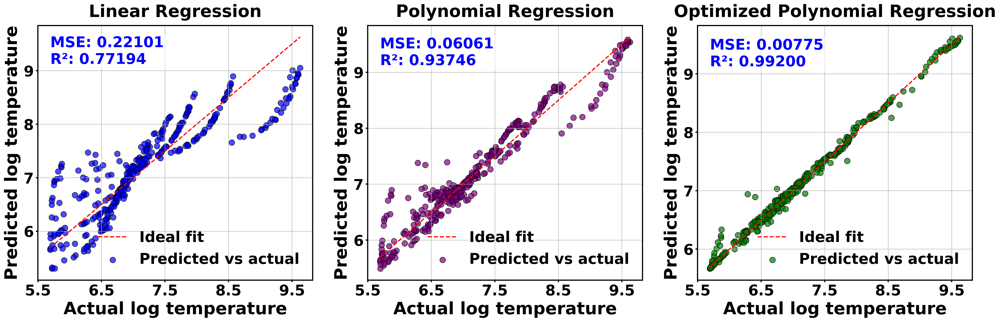

In [11]:
# 可视化线性回归、多项式回归、优化后的多项式回归结果
plt.figure(figsize=(24, 8), dpi=300)

# 线性回归结果
plt.subplot(1, 3, 1)
plt.scatter(y_test, linear_pred, color='blue', edgecolor='k', alpha=0.7, s=100, label='Predicted vs actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='Ideal fit')
plt.title('Linear Regression', fontsize=30, weight='bold', pad=15)
plt.tick_params(axis='both', which='major', width=2)
plt.xticks(np.arange(5.5, 10, 1), fontsize=26, weight='bold')
plt.yticks(fontsize=26, weight='bold')
plt.xlabel('Actual log temperature', fontsize=30, weight='bold', labelpad=5)
plt.ylabel('Predicted log temperature', fontsize=30, weight='bold',labelpad=5)
plt.legend(fontsize=26, loc='lower right', prop={'size': 26, 'weight': 'bold'}, frameon=False)
plt.text(min(y_test), max(y_test)-0.5, f'MSE: {linear_mse:.5f}\nR²: {linear_r2:.5f}', fontsize=26, color='blue', weight='bold', 
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.5))
# 加粗边框
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(2)

plt.grid(True)

# 未优化的多项式回归结果
plt.subplot(1, 3, 2)
plt.scatter(y_test, poly_pred, color='purple', edgecolor='k', alpha=0.7, s=100, label='Predicted vs actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='Ideal fit')
plt.title('Polynomial Regression', fontsize=30, weight='bold', pad=15)
plt.tick_params(axis='both', which='major', width=2)
plt.xticks(np.arange(5.5, 10, 1), fontsize=26, weight='bold')
plt.yticks(fontsize=26, weight='bold')
plt.xlabel('Actual log temperature', fontsize=30, weight='bold', labelpad=5)
plt.ylabel('Predicted log temperature', fontsize=30, weight='bold',labelpad=5)
plt.legend(fontsize=26, loc='lower right', prop={'size': 26, 'weight': 'bold'}, frameon=False)
plt.text(min(y_test), max(y_test)-0.5, f'MSE: {poly_mse:.5f}\nR²: {poly_r2:.5f}', fontsize=26, color='blue', weight='bold', 
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.5))
plt.grid(True)
# 加粗边框
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(2)

# 优化后的多项式回归结果
plt.subplot(1, 3, 3)
plt.scatter(y_test, optimized_poly_pred, color='green', edgecolor='k', alpha=0.7, s=100, label='Predicted vs actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='Ideal fit')
plt.title('Optimized Polynomial Regression', fontsize=30, weight='bold', pad=15)
plt.tick_params(axis='both', which='major', width=2)
plt.xticks(np.arange(5.5, 10, 1), fontsize=26, weight='bold')
plt.yticks(range(6, 10, 1), fontsize=26, weight='bold')
plt.xlabel('Actual log temperature', fontsize=30, weight='bold', labelpad=5)
plt.ylabel('Predicted log temperature', fontsize=30, weight='bold',labelpad=5)
plt.legend(fontsize=26, loc='lower right', prop={'size': 26, 'weight': 'bold'}, frameon=False)
plt.text(min(y_test), max(y_test)-0.5, f'MSE: {optimized_poly_mse:.5f}\nR²: {optimized_poly_r2:.5f}', fontsize=26, color='blue', weight='bold', 
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.5))
plt.grid(True)
# 加粗边框
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(2)

plt.tight_layout()
plt.subplots_adjust(wspace=0.2, hspace=0)
plt.show()



线性类模型的SHAP值评估

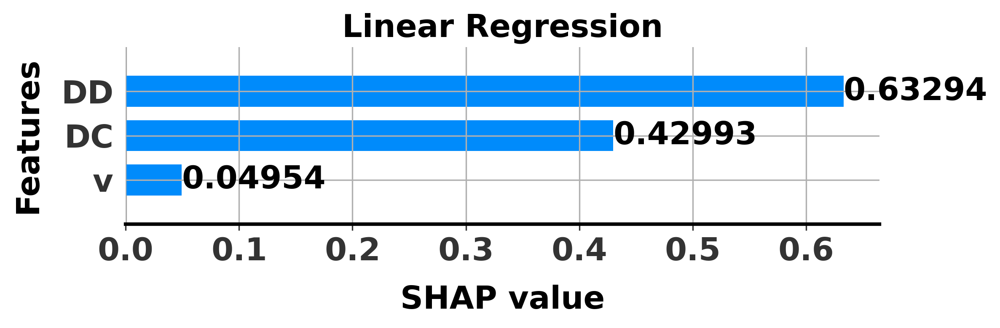

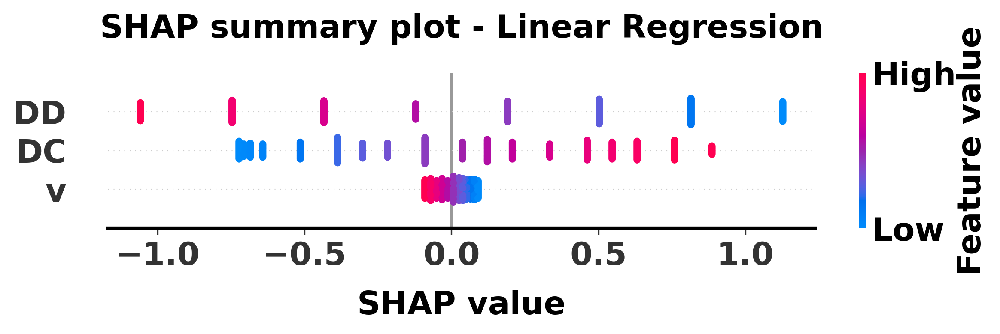

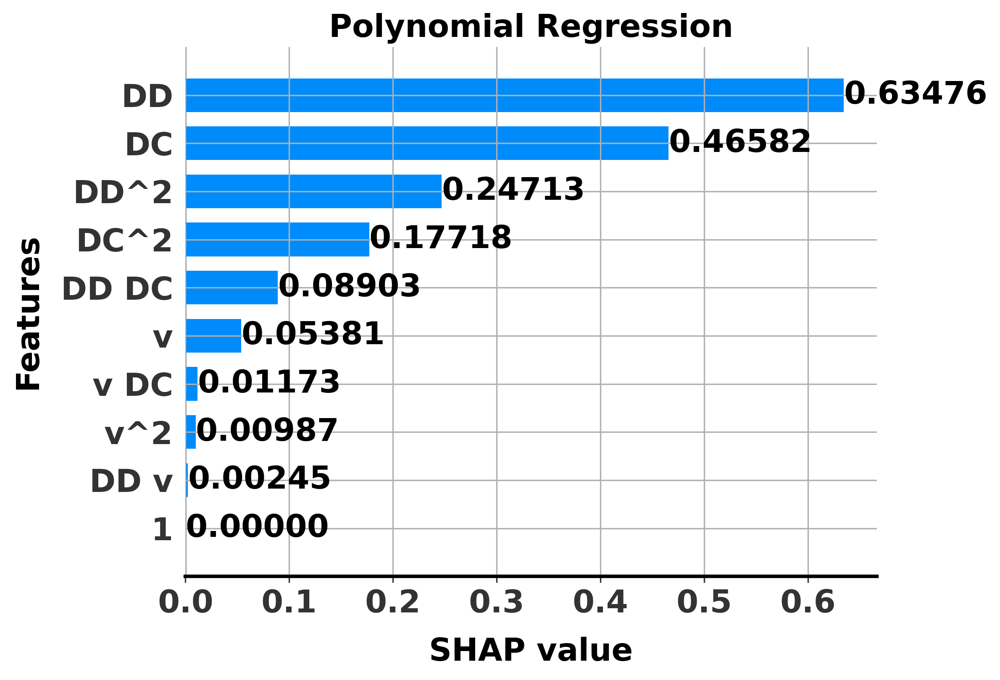

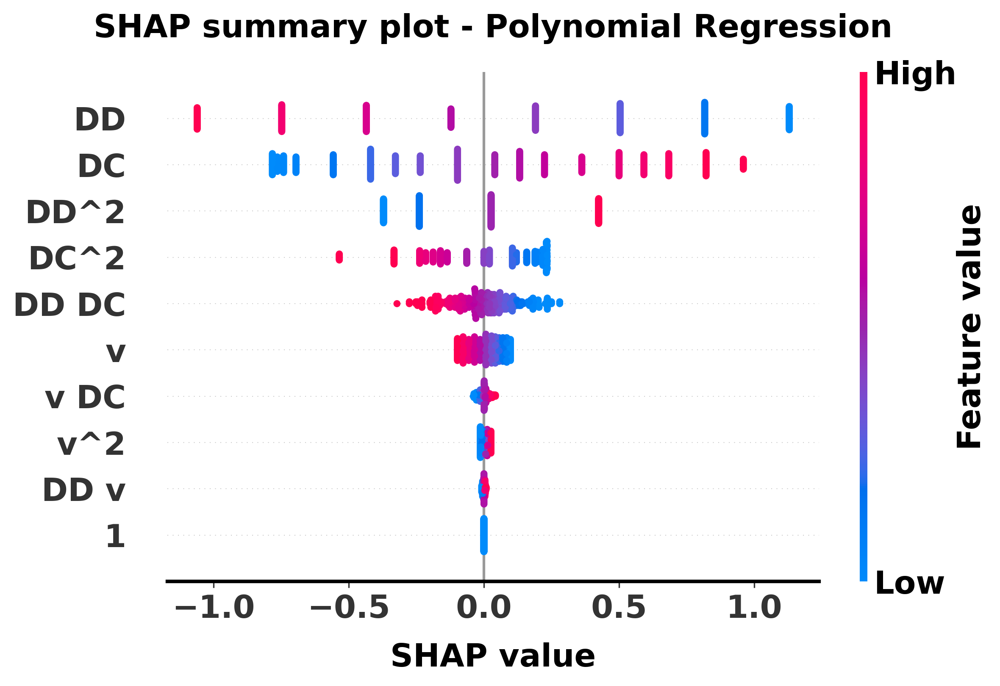

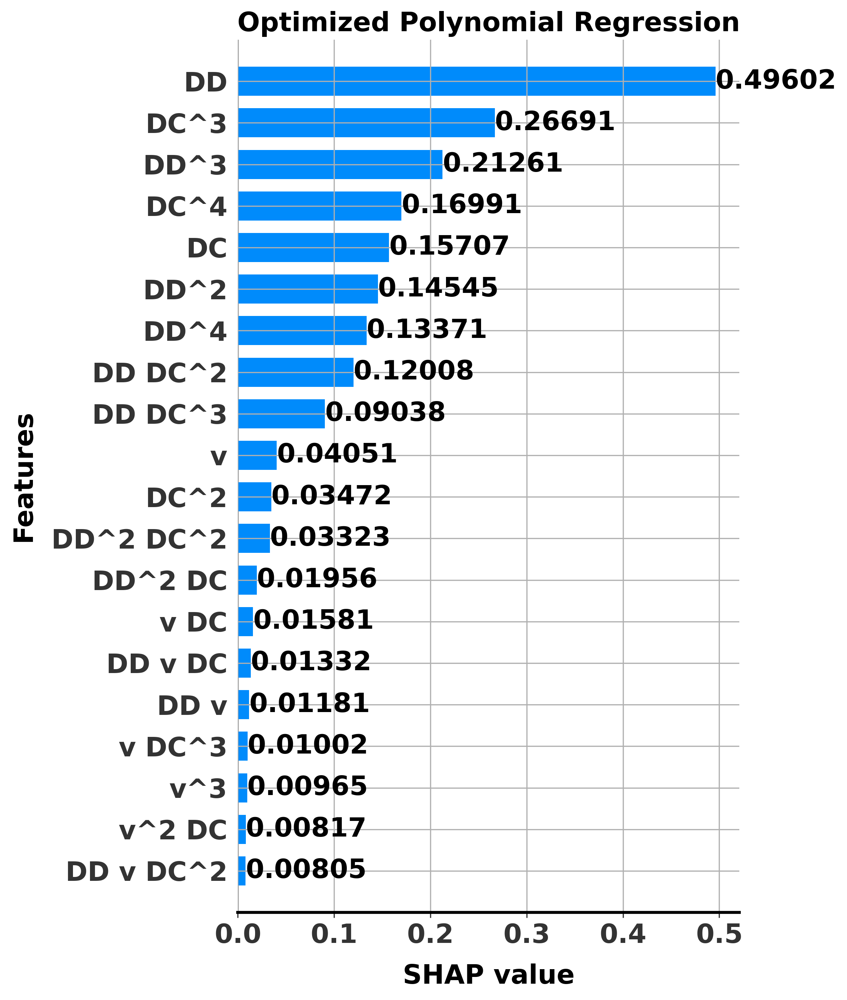

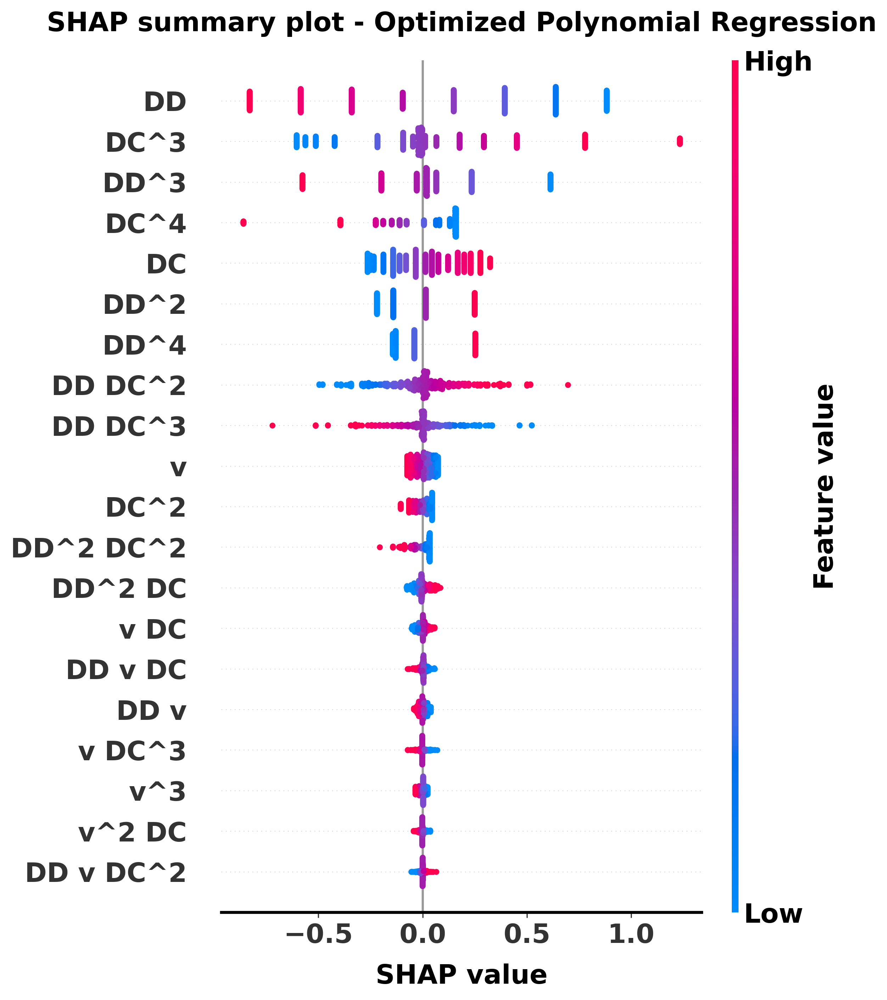

In [12]:
import shap
import matplotlib.pyplot as plt

def plot_shap_importance_and_summary(model, X_test, model_name, feature_names):
    # 根据模型类型选择合适的解释器
    explainer = shap.LinearExplainer(model, X_test)
    shap_values = explainer.shap_values(X_test)
    
    # 特征重要性图 (条形图)
    plt.figure(figsize=(8, 8), dpi=300)
    shap.summary_plot(shap_values, X_test, feature_names=feature_names, plot_type="bar", show=False)
    plt.title(f'{model_name}', fontsize=18, weight='bold')
    plt.xlabel('SHAP value', fontsize=18, weight='bold', labelpad=10)
    plt.ylabel('Features', fontsize=18, weight='bold', labelpad=10)
    plt.xticks(fontsize=18, weight='bold')
    plt.yticks(fontsize=18, weight='bold')
    plt.grid(True)
    
    # 添加数值标注
    ax = plt.gca()
    for bar in ax.patches:
        ax.annotate(f'{bar.get_width():.5f}', (bar.get_width(), bar.get_y() + bar.get_height() / 2), 
                        ha='left', va='center', fontsize=18, weight='bold')
    for spine in ax.spines.values():
        spine.set_linewidth(2)
    plt.tight_layout()
    plt.show()
    
    # 点状图
    plt.figure(figsize=(8, 8), dpi=300)
    shap.summary_plot(shap_values, X_test, feature_names=feature_names, show=False)
    plt.title(f'SHAP summary plot - {model_name}', fontsize=18, weight='bold',pad=20)
    plt.xlabel('SHAP value', fontsize=18, weight='bold', labelpad=10)
    plt.xticks(fontsize=18, weight='bold')
    plt.yticks(fontsize=18, weight='bold')
    
    # 设置颜色条样式
    color_bar = plt.gcf().axes[-1]
    color_bar.tick_params(labelsize=18, width=2)
    for label in color_bar.get_yticklabels():
        label.set_weight('bold')
    color_bar.set_ylabel('Feature value', fontsize=18, weight='bold')
    
    for spine in plt.gca().spines.values():
        spine.set_linewidth(2)
    plt.tight_layout()
    plt.show()

# 定义特征名称
linear_feature_names = X.columns
poly_feature_names = poly.get_feature_names(X.columns)
optimized_poly_feature_names = optimized_poly.get_feature_names(X.columns)

# 调用函数生成图表
plot_shap_importance_and_summary(linear_model, X_test, 'Linear Regression', linear_feature_names)
plot_shap_importance_and_summary(poly_model, X_poly_test, 'Polynomial Regression', poly_feature_names)
plot_shap_importance_and_summary(optimized_poly_model, optimized_X_poly_test, 'Optimized Polynomial Regression', optimized_poly_feature_names)


决策树类模型构建

In [13]:
# 决策树回归（限制深度和最小样本分割数以防止过拟合）
tree_model = DecisionTreeRegressor(max_depth=5, min_samples_split=10, random_state=42)
tree_model.fit(X_train, y_train)
tree_pred = tree_model.predict(X_test)

# 随机森林回归
forest_model = RandomForestRegressor(n_estimators=100, random_state=42)
forest_model.fit(X_train, y_train)
forest_pred = forest_model.predict(X_test)

# XGBoost回归
xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)
xgb_pred = xgb_model.predict(X_test)

# 调用评估函数
tree_mse, tree_r2 = evaluate_model(y_test, tree_pred, "Decision Tree")
forest_mse, forest_r2 = evaluate_model(y_test, forest_pred, "Random Forest")
xgb_mse, xgb_r2 = evaluate_model(y_test, xgb_pred, "XGBoost")

Decision Tree - Mean Squared Error: 0.01864
Decision Tree - R^2 Score: 0.98077
Random Forest - Mean Squared Error: 0.00069
Random Forest - R^2 Score: 0.99929
XGBoost - Mean Squared Error: 0.00047
XGBoost - R^2 Score: 0.99952


决策树可视化

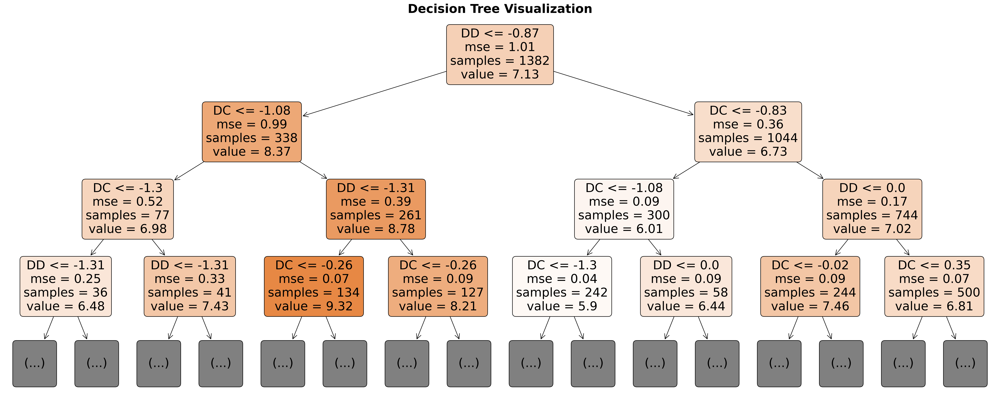

In [14]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# 设置图像大小、分辨率和主题颜色
plt.figure(figsize=(35, 14), dpi=300)

# 可视化决策树，最多展示3层，其他的层次省略
plot_tree(tree_model, 
          feature_names=['DD', 'v', 'DC'],  # 根据你的特征名称替换
          filled=True,  # 填充方框颜色
          rounded=True,  # 圆角方框
          max_depth=3,  # 只展示前3层，后面的用省略表示
          proportion=False,  # 每个节点的比例表示不需要按样本数调整
          fontsize=24,  # 设置字体大小
          precision=2,  # 控制显示小数的精度
          class_names=None  # 如果有类别标签可以填入
         )

# 设置标题
plt.title('Decision Tree Visualization', fontsize=24, weight='bold')

# 调整边框粗细
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(2)

# 保存图片到C盘桌面，暂时注释掉
# plt.savefig('C:/Users/YourUsername/Desktop/decision_tree_visualization.png', dpi=300)

plt.show()


优化XGBoost

In [15]:
# 优化的XGBoost建模和评估
# 定义参数网格
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# 创建 GridSearchCV 对象
grid_search = GridSearchCV(xgb.XGBRegressor(random_state=42), param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

# 获取最佳参数和最佳得分
best_params = grid_search.best_params_
best_score = -grid_search.best_score_
print(f"Best parameters found: {best_params}")
print(f"Best cross-validation MSE: {best_score}")

# 使用最佳参数训练最终模型
optimized_xgb_model = grid_search.best_estimator_
optimized_xgb_pred = optimized_xgb_model.predict(X_test)
optimized_xgb_mse, optimized_xgb_r2 = evaluate_model(y_test, optimized_xgb_pred, "Optimized XGBoost")

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best parameters found: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 300, 'subsample': 0.8}
Best cross-validation MSE: 0.00034962753527046096
Optimized XGBoost - Mean Squared Error: 0.00022
Optimized XGBoost - R^2 Score: 0.99977


In [16]:
# 获取特征重要性
tree_importances = tree_model.feature_importances_
forest_importances = forest_model.feature_importances_
xgb_importances = xgb_model.feature_importances_
optimized_xgb_importances = optimized_xgb_model.feature_importances_

# 打印特征重要性
def print_feature_importances(importances, feature_names, model_name):
    print(f"\n{model_name} Feature Importances:")
    for name, importance in zip(feature_names, importances):
        print(f"  {name}: {importance:.5f}")

feature_names = X.columns

print_feature_importances(tree_importances, feature_names, "Decision Tree")
print_feature_importances(forest_importances, feature_names, "Random Forest")
print_feature_importances(xgb_importances, feature_names, "XGBoost")
print_feature_importances(optimized_xgb_importances, feature_names, "Optimized XGBoost")


Decision Tree Feature Importances:
  DD: 0.63767
  v: 0.00000
  DC: 0.36233

Random Forest Feature Importances:
  DD: 0.63145
  v: 0.00556
  DC: 0.36299

XGBoost Feature Importances:
  DD: 0.69583
  v: 0.00478
  DC: 0.29939

Optimized XGBoost Feature Importances:
  DD: 0.67117
  v: 0.00413
  DC: 0.32470


可视化树型模型的结果

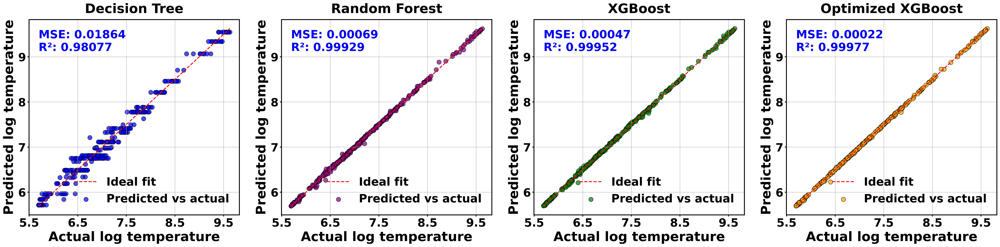

In [17]:
# 可视化结果 - 两行两列布局
plt.figure(figsize=(32, 8), dpi=300)


# 决策树回归结果
plt.subplot(1, 4, 1)
plt.scatter(y_test, tree_pred, color='blue', edgecolor='k', alpha=0.7, s=100, label='Predicted vs actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='Ideal fit')
plt.title('Decision Tree', fontsize=30, weight='bold', pad=15)
plt.tick_params(axis='both', which='major', width=2)
plt.xticks(np.arange(5.5, 10, 1), fontsize=26, weight='bold')
plt.yticks(range(6, 10, 1), fontsize=26, weight='bold')
plt.xlabel('Actual log temperature', fontsize=30, weight='bold', labelpad=5)
plt.ylabel('Predicted log temperature', fontsize=30, weight='bold', labelpad=5)
plt.legend(fontsize=26, loc='lower right', prop={'size': 26, 'weight': 'bold'}, frameon=False)
plt.text(min(y_test), max(y_test)-0.5, f'MSE: {tree_mse:.5f}\nR²: {tree_r2:.5f}', fontsize=26, color='blue', weight='bold', 
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.5))
# 加粗边框
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(2)
plt.grid(True)

# 随机森林回归结果
plt.subplot(1, 4, 2)
plt.scatter(y_test, forest_pred, color='purple', edgecolor='k', alpha=0.7, s=100, label='Predicted vs actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='Ideal fit')
plt.title('Random Forest', fontsize=30, weight='bold', pad=15)
plt.tick_params(axis='both', which='major', width=2)
plt.xticks(np.arange(5.5, 10, 1), fontsize=26, weight='bold')
plt.yticks(range(6, 10, 1), fontsize=26, weight='bold')
plt.xlabel('Actual log temperature', fontsize=30, weight='bold', labelpad=5)
plt.ylabel('Predicted log temperature', fontsize=30, weight='bold', labelpad=5)
plt.legend(fontsize=26, loc='lower right', prop={'size': 26, 'weight': 'bold'}, frameon=False)
plt.text(min(y_test), max(y_test)-0.5, f'MSE: {forest_mse:.5f}\nR²: {forest_r2:.5f}', fontsize=26, color='blue', weight='bold', 
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.5))
plt.grid(True)
# 加粗边框
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(2)

# XGBoost 回归结果
plt.subplot(1, 4, 3)
plt.scatter(y_test, xgb_pred, color='green', edgecolor='k', alpha=0.7, s=100, label='Predicted vs actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='Ideal fit')
plt.title('XGBoost', fontsize=30, weight='bold', pad=15)
plt.tick_params(axis='both', which='major', width=2)
plt.xticks(np.arange(5.5, 10, 1), fontsize=26, weight='bold')
plt.yticks(range(6, 10, 1), fontsize=26, weight='bold')
plt.xlabel('Actual log temperature', fontsize=30, weight='bold', labelpad=5)
plt.ylabel('Predicted log temperature', fontsize=30, weight='bold', labelpad=5)
plt.legend(fontsize=26, loc='lower right', prop={'size': 26, 'weight': 'bold'}, frameon=False)
plt.text(min(y_test), max(y_test)-0.5, f'MSE: {xgb_mse:.5f}\nR²: {xgb_r2:.5f}', fontsize=26, color='blue', weight='bold', 
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.5))
plt.grid(True)
# 加粗边框
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(2)

# 优化后的 XGBoost 回归结果
plt.subplot(1, 4, 4)
plt.scatter(y_test, optimized_xgb_pred, color='orange', edgecolor='k', alpha=0.7, s=100, label='Predicted vs actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='Ideal fit')
plt.title('Optimized XGBoost', fontsize=30, weight='bold', pad=15)
plt.tick_params(axis='both', which='major', width=2)
plt.xticks(np.arange(5.5, 10, 1), fontsize=26, weight='bold')
plt.yticks(range(6, 10, 1), fontsize=26, weight='bold')
plt.xlabel('Actual log temperature', fontsize=30, weight='bold', labelpad=5)
plt.ylabel('Predicted log temperature', fontsize=30, weight='bold', labelpad=5)
plt.legend(fontsize=26, loc='lower right', prop={'size': 26, 'weight': 'bold'}, frameon=False)
plt.text(min(y_test), max(y_test)-0.5, f'MSE: {optimized_xgb_mse:.5f}\nR²: {optimized_xgb_r2:.5f}', fontsize=26, color='blue', weight='bold', 
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.5))
plt.grid(True)
# 加粗边框
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(2)

plt.tight_layout()
plt.subplots_adjust(wspace=0.2, hspace=0)
plt.show()

树基模型的SHAP评估

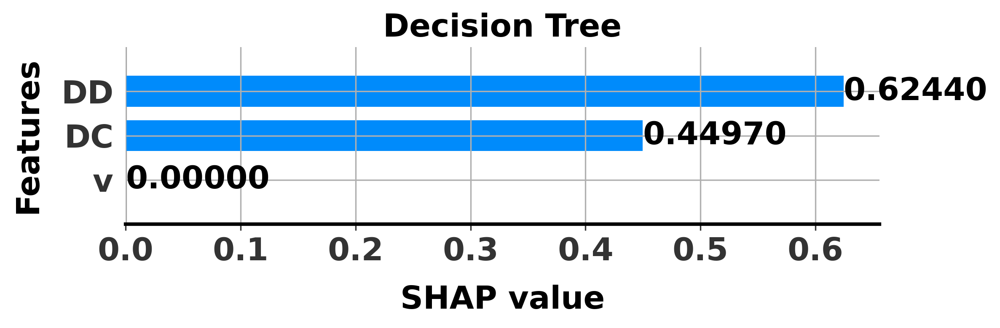

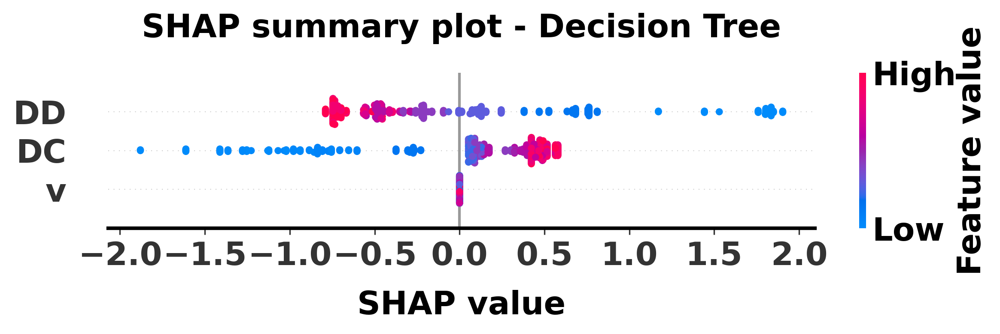

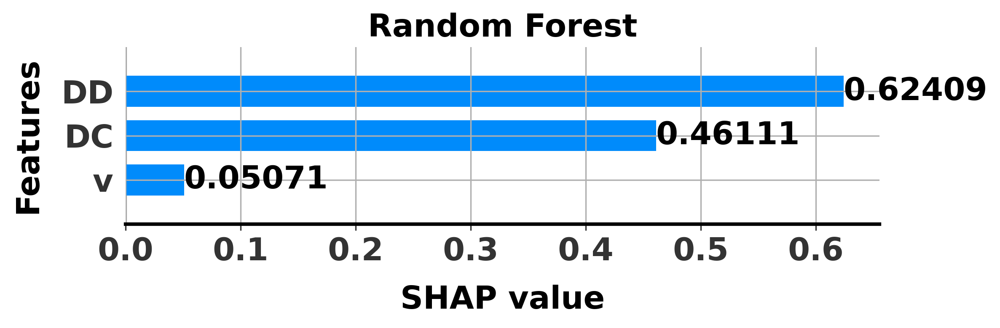

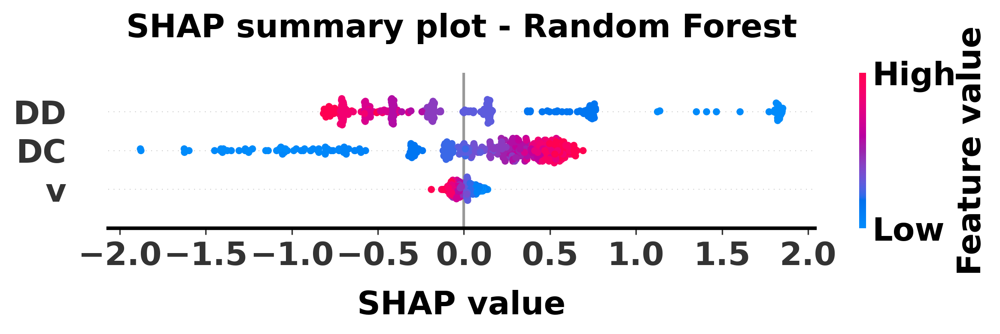

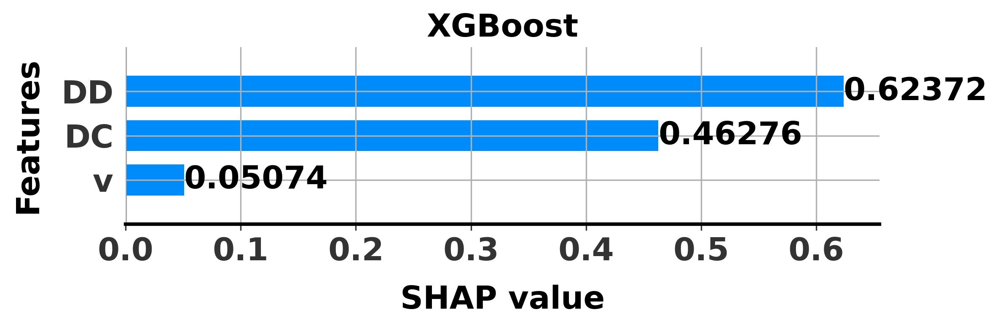

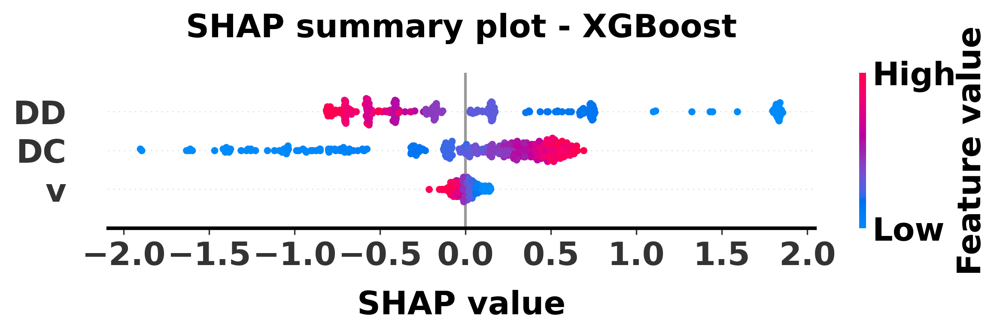

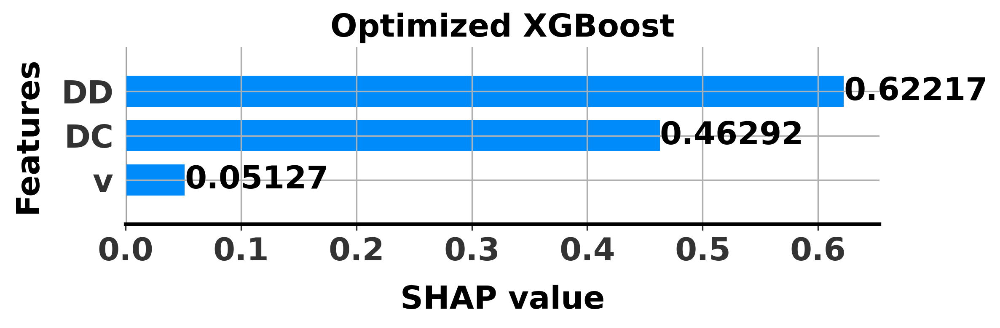

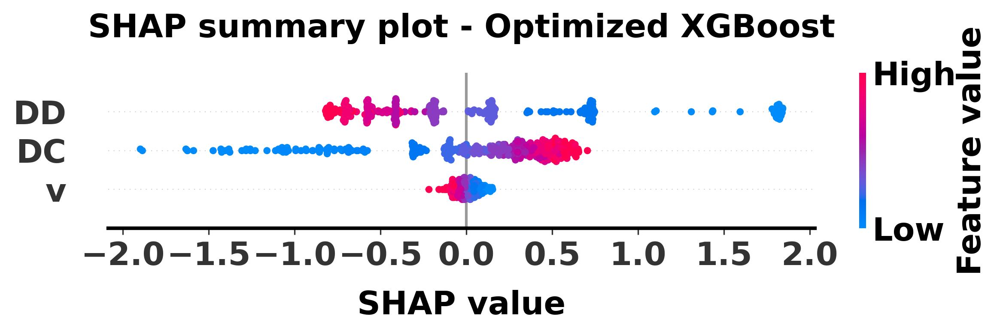

In [18]:
import shap
import matplotlib.pyplot as plt

# 定义 SHAP 可视化函数
def plot_shap_importance_and_summary(model, X_test, model_name, feature_names):
    # 使用 TreeExplainer 进行 SHAP 评估
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_test)
    
    # 设置图像大小和分辨率
    plt.figure(figsize=(8, 8), dpi=300)  # 设置图像大小为10x6英寸，分辨率为300dpi

    # SHAP 特征重要性图 (柱状图)
    shap.summary_plot(shap_values, X_test, feature_names=feature_names, plot_type="bar", show=False)
    
    # 设置字体和样式
    plt.title(f'{model_name}', fontsize=18, weight='bold')
    plt.xlabel('SHAP value', fontsize=18, weight='bold', labelpad=10)
    plt.ylabel('Features', fontsize=18, weight='bold', labelpad=10)
    plt.xticks(fontsize=18, weight='bold')
    plt.yticks(fontsize=18, weight='bold')
    plt.grid(True)
    
    # 添加数值标注
    ax = plt.gca()
    for bar in ax.patches:
        ax.annotate(f'{bar.get_width():.5f}', (bar.get_width(), bar.get_y() + bar.get_height() / 2), 
                    ha='left', va='center', fontsize=18, weight='bold')

    # 加粗边框
    for spine in ax.spines.values():
        spine.set_linewidth(2)

    plt.tight_layout()
    plt.show()

    # 设置图像大小和分辨率
    plt.figure(figsize=(8, 8), dpi=300)  # 设置图像大小为10x6英寸，分辨率为300dpi

    # SHAP Summary Plot (点状图)
    shap.summary_plot(shap_values, X_test, feature_names=feature_names, show=False)

    # 设置字体和样式
    plt.title(f'SHAP summary plot - {model_name}', fontsize=18, weight='bold', pad=20)
    plt.xlabel('SHAP value', fontsize=18, weight='bold', labelpad=10)
    plt.xticks(fontsize=18, weight='bold')
    plt.yticks(fontsize=18, weight='bold')

    # 加粗颜色条中的文字
    color_bar = plt.gcf().axes[-1]  # 获取最后一个轴 (颜色条)
    color_bar.tick_params(labelsize=18, width=2)  # 设置颜色条文字大小
    for label in color_bar.get_yticklabels():
        label.set_weight('bold')  # 加粗颜色条刻度文字
    
    # 获取颜色条右侧 Feature Value 的标签并加粗
    color_bar.set_ylabel('Feature value', fontsize=18, weight='bold')  # 加粗右侧的 Feature Value 文字

    # 加粗边框
    ax = plt.gca()
    for spine in ax.spines.values():
        spine.set_linewidth(2)

    plt.tight_layout()
    plt.show()

# 定义特征名称
feature_names = ['DD', 'v', 'DC']

# 调用 SHAP 可视化函数针对不同模型

# 决策树
plot_shap_importance_and_summary(tree_model, X_test, 'Decision Tree', feature_names)

# 随机森林
plot_shap_importance_and_summary(forest_model, X_test, 'Random Forest', feature_names)

# XGBoost
plot_shap_importance_and_summary(xgb_model, X_test, 'XGBoost', feature_names)

# 优化后的 XGBoost
plot_shap_importance_and_summary(optimized_xgb_model, X_test, 'Optimized XGBoost', feature_names)


使用浅层神经网络或者深度神经网络建模

In [19]:
# 分离特征和目标变量，并更改列名为简短形式
X = df[['DD', 'v', 'DC']].values
y = df['T'].values

# 对目标温度进行对数变换
y_log = np.log(y)

# 标准化特征
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 将数据集分成训练集和测试集，并将目标变量 reshape 适配神经网络
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_log, test_size=0.2, random_state=42)

# 转换目标变量的形状（如果使用神经网络，确保形状正确）
#y_train = y_train.reshape(-1, 1)
#y_test = y_test.reshape(-1, 1)


In [20]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import tensorflow as tf

np.random.seed(42)
tf.random.set_seed(42)


# 构建浅层神经网络模型（较浅的网络，较少的神经元）
snn_model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dropout(0.1),  # 较少的Dropout
    Dense(32, activation='relu'),
    Dense(1)
])

snn_model.compile(optimizer='adam', loss='mse', metrics=['mae'])
snn_history = snn_model.fit(X_train, y_train, validation_split=0.2, epochs=100, batch_size=32, verbose=1)

# 评估浅层神经网络回归模型
snn_pred = snn_model.predict(X_test)
snn_mse = mean_squared_error(y_test, snn_pred)
snn_r2 = r2_score(y_test, snn_pred)
print(f'SNN - Mean Squared Error: {snn_mse}')
print(f'SNN - R^2 Score: {snn_r2}')




Train on 1105 samples, validate on 277 samples
Epoch 1/100
1105/1105 [==============================] - 1s 892us/sample - loss: 42.8060 - mae: 6.4560 - val_loss: 31.0506 - val_mae: 5.4947
Epoch 2/100
1105/1105 [==============================] - 0s 50us/sample - loss: 22.1675 - mae: 4.5436 - val_loss: 10.8687 - val_mae: 3.1078
Epoch 3/100
1105/1105 [==============================] - 0s 52us/sample - loss: 5.4889 - mae: 1.9762 - val_loss: 2.0250 - val_mae: 1.1378
Epoch 4/100
1105/1105 [==============================] - 0s 50us/sample - loss: 1.9613 - mae: 1.1266 - val_loss: 1.6926 - val_mae: 1.0477
Epoch 5/100
1105/1105 [==============================] - 0s 49us/sample - loss: 1.7012 - mae: 1.0503 - val_loss: 1.5487 - val_mae: 0.9986
Epoch 6/100
1105/1105 [==============================] - 0s 47us/sample - loss: 1.6809 - mae: 1.0434 - val_loss: 1.4274 - val_mae: 0.9571
Epoch 7/100
1105/1105 [==============================] - 0s 49us/sample - loss: 1.5069 - mae: 0.9753 - val_loss: 1.3248 

In [21]:
# 构建深度神经网络模型（更深的网络）
dnn_model = Sequential([
    Dense(512, activation='relu', input_shape=(X_train.shape[1],)),  # 增加神经元数
    Dropout(0.4),  # 增加Dropout，防止过拟合
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(64, activation='relu'),
    Dense(1)
])

dnn_model.compile(optimizer='adam', loss='mse', metrics=['mae'])
dnn_history = dnn_model.fit(X_train, y_train, validation_split=0.2, epochs=100, batch_size=32, verbose=1)

# 评估深度神经网络回归模型
dnn_pred = dnn_model.predict(X_test)
dnn_mse = mean_squared_error(y_test, dnn_pred)
dnn_r2 = r2_score(y_test, dnn_pred)
print(f'DNN - Mean Squared Error: {dnn_mse}')
print(f'DNN - R^2 Score: {dnn_r2}')


Train on 1105 samples, validate on 277 samples
Epoch 1/100
1105/1105 [==============================] - 1s 714us/sample - loss: 14.3260 - mae: 3.0587 - val_loss: 2.6154 - val_mae: 1.2782
Epoch 2/100
1105/1105 [==============================] - 0s 93us/sample - loss: 3.0224 - mae: 1.3902 - val_loss: 2.2184 - val_mae: 1.1685
Epoch 3/100
1105/1105 [==============================] - 0s 97us/sample - loss: 2.2214 - mae: 1.1853 - val_loss: 1.3296 - val_mae: 0.9085
Epoch 4/100
1105/1105 [==============================] - 0s 91us/sample - loss: 1.6858 - mae: 1.0415 - val_loss: 0.8628 - val_mae: 0.7393
Epoch 5/100
1105/1105 [==============================] - 0s 96us/sample - loss: 1.3912 - mae: 0.9642 - val_loss: 0.7731 - val_mae: 0.7451
Epoch 6/100
1105/1105 [==============================] - 0s 90us/sample - loss: 0.9493 - mae: 0.7776 - val_loss: 0.2392 - val_mae: 0.3961
Epoch 7/100
1105/1105 [==============================] - 0s 106us/sample - loss: 0.7017 - mae: 0.6705 - val_loss: 0.1433 - 

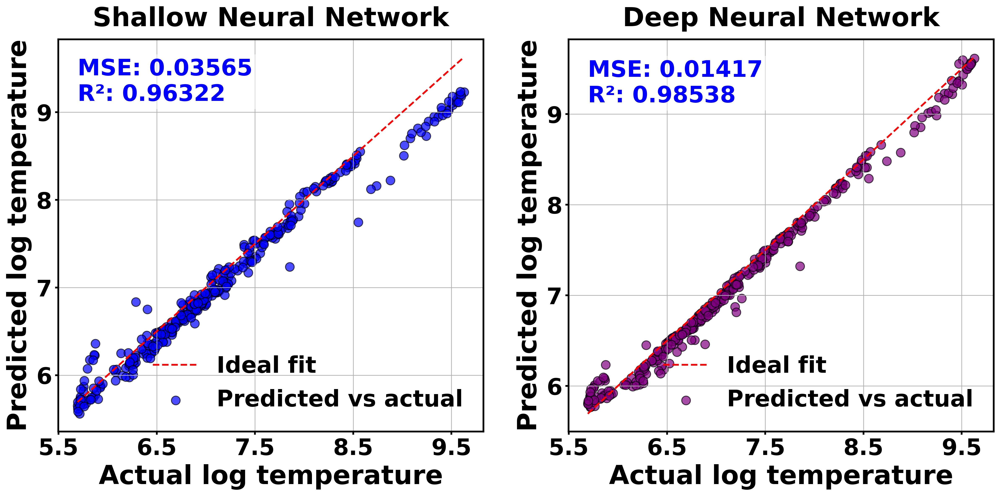

In [22]:
# 可视化SNN神经网络与DNN结果对比
plt.figure(figsize=(16, 8), dpi=300)

# SNN神经网络结果
plt.subplot(1, 2, 1)
plt.scatter(y_test, snn_pred, color='blue', edgecolor='k', alpha=0.7, s=100, label='Predicted vs actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='Ideal fit')
plt.title('Shallow Neural Network', fontsize=30, weight='bold', pad=15)
plt.tick_params(axis='both', which='major', width=2)
plt.xticks(np.arange(5.5, 10, 1), fontsize=26, weight='bold')
plt.yticks(range(6, 10, 1), fontsize=26, weight='bold')
plt.xlabel('Actual log temperature', fontsize=30, weight='bold', labelpad=5)
plt.ylabel('Predicted log temperature', fontsize=30, weight='bold', labelpad=5)
plt.legend(fontsize=26, loc='lower right', prop={'size': 26, 'weight': 'bold'}, frameon=False)
plt.text(min(y_test), max(y_test)-0.5, f'MSE: {snn_mse:.5f}\nR²: {snn_r2:.5f}', fontsize=26, color='blue', weight='bold', 
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.5))
plt.grid(True)

# 加粗边框
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(2)

# 深度神经网络结果
plt.subplot(1, 2, 2)
plt.scatter(y_test, dnn_pred, color='purple', edgecolor='k', alpha=0.7, s=100, label='Predicted vs actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='Ideal fit')
plt.title('Deep Neural Network', fontsize=30, weight='bold', pad=15)
plt.tick_params(axis='both', which='major', width=2)
plt.xticks(np.arange(5.5, 10, 1), fontsize=26, weight='bold')
plt.yticks(range(6, 10, 1), fontsize=26, weight='bold')
plt.xlabel('Actual log temperature', fontsize=30, weight='bold', labelpad=5)
plt.ylabel('Predicted log temperature', fontsize=30, weight='bold', labelpad=5)
plt.legend(fontsize=26, loc='lower right', prop={'size': 26, 'weight': 'bold'}, frameon=False)
plt.text(min(y_test), max(y_test)-0.5, f'MSE: {dnn_mse:.5f}\nR²: {dnn_r2:.5f}', fontsize=26, color='blue', weight='bold', 
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.5))
plt.grid(True)

# 加粗边框
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(2)

plt.tight_layout()
plt.subplots_adjust(wspace=0.2, hspace=0)
# 保存图片到C盘桌面
# plt.savefig('C:/Users/YourUsername/Desktop/snn_vs_dnn_regression.png', dpi=300)

plt.show()



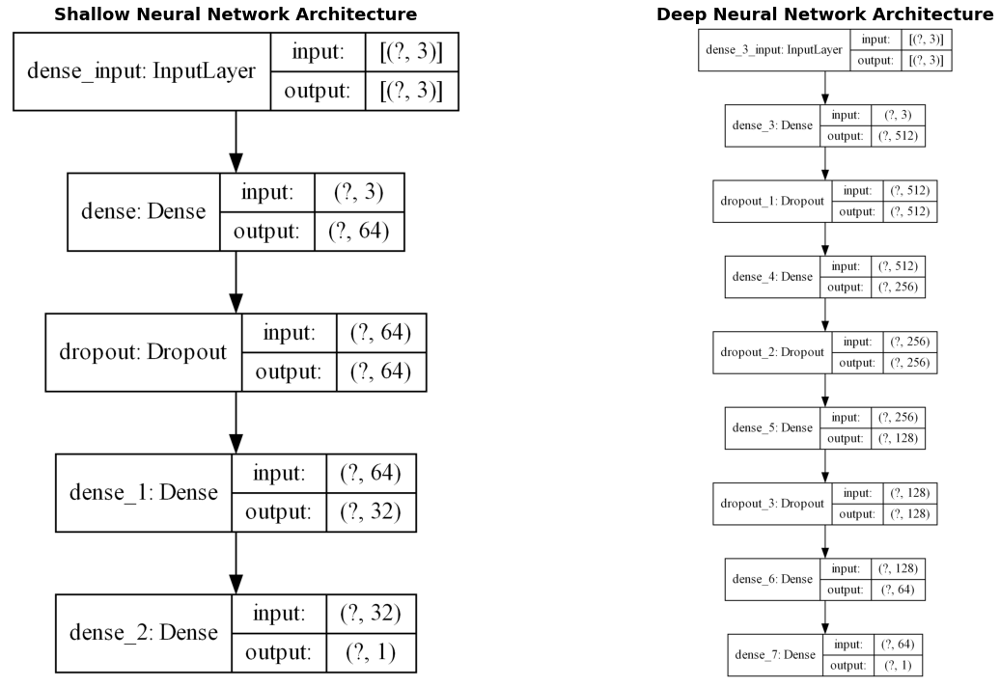

In [23]:
from tensorflow.keras.utils import plot_model

# 可视化BP神经网络架构
plot_model(snn_model, to_file='bp_nn_architecture.png', show_shapes=True, show_layer_names=True, dpi=300, rankdir='TB')

# 可视化深度神经网络架构
plot_model(dnn_model, to_file='dnn_architecture.png', show_shapes=True, show_layer_names=True, dpi=300, rankdir='TB')

# 并列展示架构图
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# BP神经网络架构图
bp_image = plt.imread('bp_nn_architecture.png')
axes[0].imshow(bp_image)
axes[0].axis('off')
axes[0].set_title('Shallow Neural Network Architecture', fontsize=18, weight='bold')

# 深度神经网络架构图
dnn_image = plt.imread('dnn_architecture.png')
axes[1].imshow(dnn_image)
axes[1].axis('off')
axes[1].set_title('Deep Neural Network Architecture', fontsize=18, weight='bold')

plt.tight_layout()

# 保存图片到C盘桌面
# plt.savefig('C:/Users/YourUsername/Desktop/bp_vs_dnn_architecture.png', dpi=300)

plt.show()


100%|██████████| 100/100 [00:08<00:00, 11.38it/s]


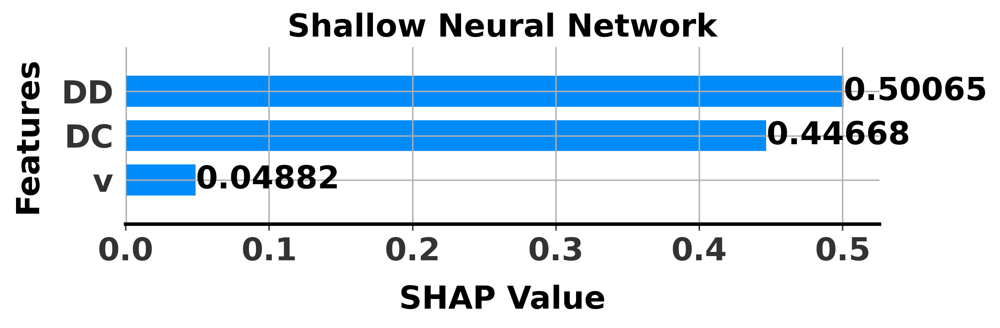

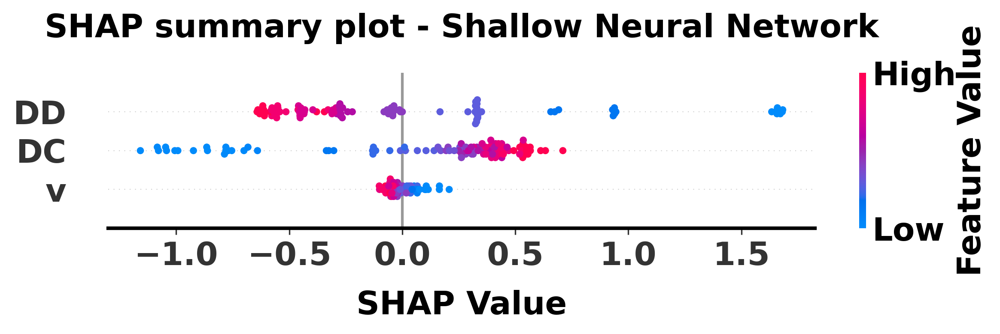

100%|██████████| 100/100 [00:10<00:00,  9.96it/s]


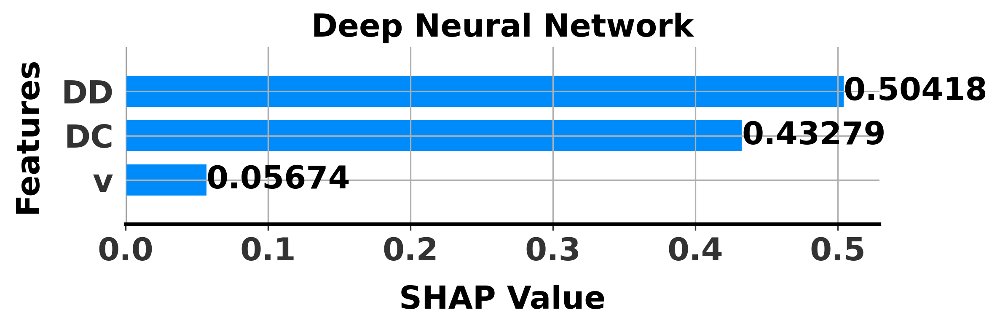

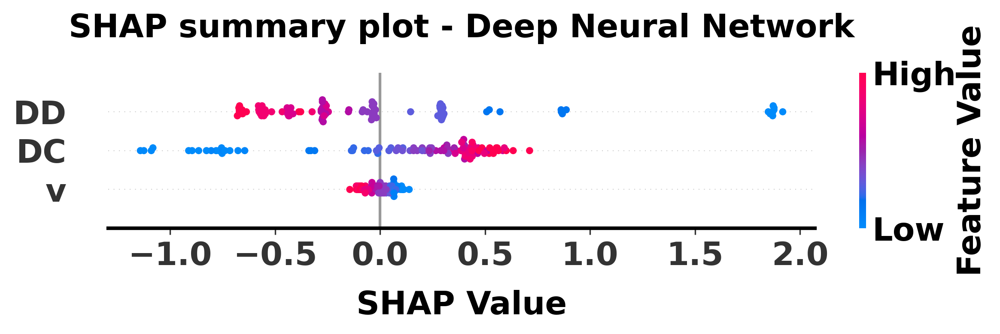

In [24]:
import shap
import matplotlib.pyplot as plt

# 定义用于神经网络的 SHAP 可视化函数
def plot_shap_importance_and_summary_nn(model, X_train, X_test, model_name, feature_names):
    # 使用 KernelExplainer 进行 SHAP 评估
    explainer = shap.KernelExplainer(model.predict, X_train[:100])
    shap_values = explainer.shap_values(X_test[:100], nsamples=100)

    # 如果 shap_values 是列表，选择第一个元素作为单一输出
    if isinstance(shap_values, list):
        shap_values = shap_values[0]

    # 特征重要性图 (柱状图)
    plt.figure(figsize=(8, 8), dpi=300)
    shap.summary_plot(shap_values, X_test[:100], feature_names=feature_names, plot_type="bar", show=False)
    plt.title(f'{model_name}', fontsize=18, weight='bold')
    plt.xlabel('SHAP Value', fontsize=18, weight='bold', labelpad=10)
    plt.ylabel('Features', fontsize=18, weight='bold', labelpad=10)
    plt.xticks(fontsize=18, weight='bold')
    plt.yticks(fontsize=18, weight='bold')
    plt.grid(True)
    ax = plt.gca()
    for bar in ax.patches:
        ax.annotate(f'{bar.get_width():.5f}', (bar.get_width(), bar.get_y() + bar.get_height() / 2), 
                    ha='left', va='center', fontsize=18, weight='bold')
    for spine in ax.spines.values():
        spine.set_linewidth(2)
    plt.tight_layout()
    plt.show()

    # Summary Plot (点状图)
    plt.figure(figsize=(8, 8), dpi=300)
    shap.summary_plot(shap_values, X_test[:100], feature_names=feature_names, plot_type="dot", show=False)
    plt.title(f'SHAP summary plot - {model_name}', fontsize=18, weight='bold', pad=20)
    plt.xlabel('SHAP Value', fontsize=18, weight='bold', labelpad=10)
    plt.xticks(fontsize=18, weight='bold')
    plt.yticks(fontsize=18, weight='bold')

    # 加粗颜色条中的文字
    color_bar = plt.gcf().axes[-1]
    color_bar.tick_params(labelsize=18, width=2)
    for label in color_bar.get_yticklabels():
        label.set_weight('bold')
    color_bar.set_ylabel('Feature Value', fontsize=18, weight='bold')

    ax = plt.gca()
    for spine in ax.spines.values():
        spine.set_linewidth(2)

    plt.tight_layout()
    plt.show()

# 特征名称
feature_names = ['DD', 'v', 'DC']

# 调用 SHAP 可视化函数针对神经网络

# SNN 神经网络
plot_shap_importance_and_summary_nn(snn_model, X_train, X_test, 'Shallow Neural Network', feature_names)

# DNN 神经网络
plot_shap_importance_and_summary_nn(dnn_model, X_train, X_test, 'Deep Neural Network', feature_names)

SNN预测

In [25]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler

# 设置随机种子确保结果可重复
np.random.seed(42)

# 输入随机数生成范围，设置精度
DD_values = np.round(np.random.uniform(0, 21, 10), 0)  # 在 [0, 21) 范围内生成 10 个 DD，保留整数
v_values = np.random.choice(np.arange(20, 301, 1), 10)  # 在 [20, 300] 范围内，选择整1倍数的 v，无小数位
DC_values = np.round(np.random.uniform(0.1, 38, 10), 1)  # 在 [0.1, 38) 范围内生成 10 个 DC，保留1位小数


# 固定值
fixed_v = 100
fixed_DC = 10
fixed_DD = 6

# 生成三种不同的输入数据集
input_data1 = pd.DataFrame({'DD': DD_values, 'v': fixed_v, 'DC': fixed_DC})
input_data2 = pd.DataFrame({'DD': fixed_DD, 'v': v_values, 'DC': fixed_DC})
input_data3 = pd.DataFrame({'DD': fixed_DD, 'v': fixed_v, 'DC': DC_values})

# 标准化新输入数据
scaler = StandardScaler()
scaler.fit(X)  # 使用完整数据集 X 进行 fit
scaled_input_data1 = scaler.transform(input_data1)
scaled_input_data2 = scaler.transform(input_data2)
scaled_input_data3 = scaler.transform(input_data3)

# 使用深度神经网络模型进行预测
predicted_log_T1 = snn_model.predict(scaled_input_data1)
predicted_log_T2 = snn_model.predict(scaled_input_data2)
predicted_log_T3 = snn_model.predict(scaled_input_data3)

# 反向转换为实际 T 值
predicted_T1 = np.exp(predicted_log_T1)
predicted_T2 = np.exp(predicted_log_T2)
predicted_T3 = np.exp(predicted_log_T3)

# 输出结果并显示对应的随机变量值
print("Predicted T values for varying DD (fixed v=100, DC=10):")
for dd, t in zip(DD_values, predicted_T1):
    print(f"DD: {dd}, Predicted T: {t[0]:.2f}")

print("\nPredicted T values for varying v (fixed DD=6, DC=10):")
for v, t in zip(v_values, predicted_T2):
    print(f"v: {v}, Predicted T: {t[0]:.2f}")

print("\nPredicted T values for varying DC (fixed DD=6, v=100):")
for dc, t in zip(DC_values, predicted_T3):
    print(f"DC: {dc}, Predicted T: {t[0]:.2f}")


Predicted T values for varying DD (fixed v=100, DC=10):
DD: 8.0, Predicted T: 1238.37
DD: 20.0, Predicted T: 544.84
DD: 15.0, Predicted T: 613.51
DD: 13.0, Predicted T: 711.54
DD: 3.0, Predicted T: 3009.70
DD: 3.0, Predicted T: 3009.70
DD: 1.0, Predicted T: 4955.21
DD: 18.0, Predicted T: 557.21
DD: 13.0, Predicted T: 711.54
DD: 15.0, Predicted T: 613.51

Predicted T values for varying v (fixed DD=6, DC=10):
v: 169, Predicted T: 1513.45
v: 277, Predicted T: 1165.77
v: 211, Predicted T: 1345.13
v: 296, Predicted T: 1165.85
v: 180, Predicted T: 1467.43
v: 41, Predicted T: 1710.65
v: 272, Predicted T: 1172.24
v: 255, Predicted T: 1208.68
v: 68, Predicted T: 1687.33
v: 78, Predicted T: 1676.36

Predicted T values for varying DC (fixed DD=6, v=100):
DC: 15.3, Predicted T: 1862.72
DC: 1.9, Predicted T: 515.43
DC: 37.0, Predicted T: 2496.01
DC: 8.9, Predicted T: 1470.36
DC: 3.5, Predicted T: 727.78
DC: 23.5, Predicted T: 2068.86
DC: 14.6, Predicted T: 1846.51
DC: 37.4, Predicted T: 2517.94
DC:

DNN

In [26]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler

# 设置随机种子确保结果可重复
np.random.seed(42)

# 输入随机数生成范围，设置精度
DD_values = np.round(np.random.uniform(0, 21, 10), 0)  # 在 [0, 21) 范围内生成 10 个 DD，保留整数
v_values = np.random.choice(np.arange(20, 301, 1), 10)  # 在 [20, 300] 范围内，选择整1倍数的 v，无小数位
DC_values = np.round(np.random.uniform(0.1, 38, 10), 1)  # 在 [0.1, 38) 范围内生成 10 个 DC，保留1位小数


# 固定值
fixed_v = 100
fixed_DC = 10
fixed_DD = 6

# 生成三种不同的输入数据集
input_data1 = pd.DataFrame({'DD': DD_values, 'v': fixed_v, 'DC': fixed_DC})
input_data2 = pd.DataFrame({'DD': fixed_DD, 'v': v_values, 'DC': fixed_DC})
input_data3 = pd.DataFrame({'DD': fixed_DD, 'v': fixed_v, 'DC': DC_values})

# 标准化新输入数据
scaler = StandardScaler()
scaler.fit(X)  # 使用完整数据集 X 进行 fit
scaled_input_data1 = scaler.transform(input_data1)
scaled_input_data2 = scaler.transform(input_data2)
scaled_input_data3 = scaler.transform(input_data3)

# 使用深度神经网络模型进行预测
predicted_log_T1 = dnn_model.predict(scaled_input_data1)
predicted_log_T2 = dnn_model.predict(scaled_input_data2)
predicted_log_T3 = dnn_model.predict(scaled_input_data3)

# 反向转换为实际 T 值
predicted_T1 = np.exp(predicted_log_T1)
predicted_T2 = np.exp(predicted_log_T2)
predicted_T3 = np.exp(predicted_log_T3)

# 输出结果并显示对应的随机变量值
print("Predicted T values for varying DD (fixed v=100, DC=10):")
for dd, t in zip(DD_values, predicted_T1):
    print(f"DD: {dd}, Predicted T: {t[0]:.2f}")

print("\nPredicted T values for varying v (fixed DD=6, DC=10):")
for v, t in zip(v_values, predicted_T2):
    print(f"v: {v}, Predicted T: {t[0]:.2f}")

print("\nPredicted T values for varying DC (fixed DD=6, v=100):")
for dc, t in zip(DC_values, predicted_T3):
    print(f"DC: {dc}, Predicted T: {t[0]:.2f}")

Predicted T values for varying DD (fixed v=100, DC=10):
DD: 8.0, Predicted T: 1157.26
DD: 20.0, Predicted T: 564.17
DD: 15.0, Predicted T: 682.28
DD: 13.0, Predicted T: 770.11
DD: 3.0, Predicted T: 2682.39
DD: 3.0, Predicted T: 2682.39
DD: 1.0, Predicted T: 5385.31
DD: 18.0, Predicted T: 594.24
DD: 13.0, Predicted T: 770.11
DD: 15.0, Predicted T: 682.28

Predicted T values for varying v (fixed DD=6, DC=10):
v: 169, Predicted T: 1427.10
v: 277, Predicted T: 1207.84
v: 211, Predicted T: 1349.18
v: 296, Predicted T: 1160.05
v: 180, Predicted T: 1411.87
v: 41, Predicted T: 1543.35
v: 272, Predicted T: 1220.74
v: 255, Predicted T: 1263.04
v: 68, Predicted T: 1533.99
v: 78, Predicted T: 1527.72

Predicted T values for varying DC (fixed DD=6, v=100):
DC: 15.3, Predicted T: 1825.07
DC: 1.9, Predicted T: 518.76
DC: 37.0, Predicted T: 2655.34
DC: 8.9, Predicted T: 1424.92
DC: 3.5, Predicted T: 772.24
DC: 23.5, Predicted T: 2182.94
DC: 14.6, Predicted T: 1784.36
DC: 37.4, Predicted T: 2663.29
DC:

多项式预测

Optimized PR

In [27]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, PolynomialFeatures

# 设置随机种子确保结果可重复
np.random.seed(42)

# 输入随机数生成范围，设置精度
DD_values = np.round(np.random.uniform(0, 21, 10), 0)  # 在 [0, 21) 范围内生成 10 个 DD，保留整数
v_values = np.random.choice(np.arange(20, 301, 1), 10)  # 在 [20, 300] 范围内，选择整1倍数的 v，无小数位
DC_values = np.round(np.random.uniform(0.1, 38, 10), 1)  # 在 [0.1, 38) 范围内生成 10 个 DC，保留1位小数

# 固定值
fixed_v = 100
fixed_DC = 10
fixed_DD = 6

# 生成三种不同的输入数据集
input_data1 = pd.DataFrame({'DD': DD_values, 'v': fixed_v, 'DC': fixed_DC})
input_data2 = pd.DataFrame({'DD': fixed_DD, 'v': v_values, 'DC': fixed_DC})
input_data3 = pd.DataFrame({'DD': fixed_DD, 'v': fixed_v, 'DC': DC_values})

# 使用之前在训练数据上fit的标准化器
scaler = StandardScaler().fit(X)
scaled_input_data1 = scaler.transform(input_data1)
scaled_input_data2 = scaler.transform(input_data2)
scaled_input_data3 = scaler.transform(input_data3)

# 生成多项式特征（degree=4，与优化模型一致）
poly = PolynomialFeatures(degree=4)
scaled_poly_input_data1 = poly.fit_transform(scaled_input_data1)
scaled_poly_input_data2 = poly.fit_transform(scaled_input_data2)
scaled_poly_input_data3 = poly.fit_transform(scaled_input_data3)

# 使用优化的多项式回归模型进行预测
predicted_log_T1 = optimized_poly_model.predict(scaled_poly_input_data1)
predicted_log_T2 = optimized_poly_model.predict(scaled_poly_input_data2)
predicted_log_T3 = optimized_poly_model.predict(scaled_poly_input_data3)

# 反向转换为实际 T 值
predicted_T1 = np.exp(predicted_log_T1)
predicted_T2 = np.exp(predicted_log_T2)
predicted_T3 = np.exp(predicted_log_T3)

# 输出结果并显示对应的随机变量值
print("Predicted T values for varying DD (fixed v=100, DC=10):")
for dd, t in zip(DD_values, predicted_T1):
    print(f"DD: {dd}, Predicted T: {t:.2f}")

print("\nPredicted T values for varying v (fixed DD=6, DC=10):")
for v, t in zip(v_values, predicted_T2):
    print(f"v: {v}, Predicted T: {t:.2f}")

print("\nPredicted T values for varying DC (fixed DD=6, v=100):")
for dc, t in zip(DC_values, predicted_T3):
    print(f"DC: {dc}, Predicted T: {t:.2f}")


Predicted T values for varying DD (fixed v=100, DC=10):
DD: 8.0, Predicted T: 1241.72
DD: 20.0, Predicted T: 595.56
DD: 15.0, Predicted T: 757.28
DD: 13.0, Predicted T: 851.19
DD: 3.0, Predicted T: 2990.44
DD: 3.0, Predicted T: 2990.44
DD: 1.0, Predicted T: 5871.40
DD: 18.0, Predicted T: 645.03
DD: 13.0, Predicted T: 851.19
DD: 15.0, Predicted T: 757.28

Predicted T values for varying v (fixed DD=6, DC=10):
v: 169, Predicted T: 1520.45
v: 277, Predicted T: 1413.90
v: 211, Predicted T: 1477.30
v: 296, Predicted T: 1399.64
v: 180, Predicted T: 1509.11
v: 41, Predicted T: 1705.10
v: 272, Predicted T: 1418.11
v: 255, Predicted T: 1433.48
v: 68, Predicted T: 1647.99
v: 78, Predicted T: 1630.86

Predicted T values for varying DC (fixed DD=6, v=100):
DC: 15.3, Predicted T: 1919.50
DC: 1.9, Predicted T: 574.03
DC: 37.0, Predicted T: 2878.57
DC: 8.9, Predicted T: 1489.62
DC: 3.5, Predicted T: 787.45
DC: 23.5, Predicted T: 2148.33
DC: 14.6, Predicted T: 1892.86
DC: 37.4, Predicted T: 2885.88
DC:

optimized xgboost预测

In [28]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler

# 设置随机种子确保结果可重复
np.random.seed(42)

# 输入随机数生成范围，设置精度
DD_values = np.round(np.random.uniform(0, 21, 10), 0)  # 在 [0, 21) 范围内生成 10 个 DD，保留整数
v_values = np.random.choice(np.arange(20, 301, 1), 10)  # 在 [20, 300] 范围内，选择整1倍数的 v，无小数位
DC_values = np.round(np.random.uniform(0.1, 38, 10), 1)  # 在 [0.1, 38) 范围内生成 10 个 DC，保留1位小数

# 固定值
fixed_v = 100
fixed_DC = 10
fixed_DD = 6

# 生成三种不同的输入数据集
input_data1 = pd.DataFrame({'DD': DD_values, 'v': fixed_v, 'DC': fixed_DC})
input_data2 = pd.DataFrame({'DD': fixed_DD, 'v': v_values, 'DC': fixed_DC})
input_data3 = pd.DataFrame({'DD': fixed_DD, 'v': fixed_v, 'DC': DC_values})

# 标准化新输入数据
scaler = StandardScaler()
scaler.fit(X)  # 使用完整数据集 X 进行 fit
scaled_input_data1 = scaler.transform(input_data1)
scaled_input_data2 = scaler.transform(input_data2)
scaled_input_data3 = scaler.transform(input_data3)

# 使用优化的 XGBoost 模型进行预测
predicted_log_T1 = optimized_xgb_model.predict(scaled_input_data1)
predicted_log_T2 = optimized_xgb_model.predict(scaled_input_data2)
predicted_log_T3 = optimized_xgb_model.predict(scaled_input_data3)

# 反向转换为实际 T 值
predicted_T1 = np.exp(predicted_log_T1)
predicted_T2 = np.exp(predicted_log_T2)
predicted_T3 = np.exp(predicted_log_T3)

# 输出结果并显示对应的随机变量值
print("Predicted T values for varying DD (fixed v=100, DC=10):")
for dd, t in zip(DD_values, predicted_T1):
    print(f"DD: {dd}, Predicted T: {t:.2f}")

print("\nPredicted T values for varying v (fixed DD=6, DC=10):")
for v, t in zip(v_values, predicted_T2):
    print(f"v: {v}, Predicted T: {t:.2f}")

print("\nPredicted T values for varying DC (fixed DD=6, v=100):")
for dc, t in zip(DC_values, predicted_T3):
    print(f"DC: {dc}, Predicted T: {t:.2f}")


Predicted T values for varying DD (fixed v=100, DC=10):
DD: 8.0, Predicted T: 1059.96
DD: 20.0, Predicted T: 576.67
DD: 15.0, Predicted T: 720.54
DD: 13.0, Predicted T: 845.64
DD: 3.0, Predicted T: 2779.99
DD: 3.0, Predicted T: 2779.99
DD: 1.0, Predicted T: 8985.43
DD: 18.0, Predicted T: 639.55
DD: 13.0, Predicted T: 845.64
DD: 15.0, Predicted T: 720.54

Predicted T values for varying v (fixed DD=6, DC=10):
v: 169, Predicted T: 1407.10
v: 277, Predicted T: 1337.94
v: 211, Predicted T: 1382.96
v: 296, Predicted T: 1307.34
v: 180, Predicted T: 1407.10
v: 41, Predicted T: 1571.24
v: 272, Predicted T: 1337.94
v: 255, Predicted T: 1337.94
v: 68, Predicted T: 1547.53
v: 78, Predicted T: 1520.52

Predicted T values for varying DC (fixed DD=6, v=100):
DC: 15.3, Predicted T: 1838.61
DC: 1.9, Predicted T: 688.93
DC: 37.0, Predicted T: 2857.24
DC: 8.9, Predicted T: 1340.84
DC: 3.5, Predicted T: 1059.32
DC: 23.5, Predicted T: 2355.59
DC: 14.6, Predicted T: 1838.61
DC: 37.4, Predicted T: 2857.24
DC